In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

# cd drive/MyDrive/spring23-team-2/deliverables/deliverables\ 3

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from folium.plugins import HeatMap
from folium import Map
from folium import Marker
import re

# edit??????
# The Shape data of Districts in Boston
shape = pd.read_csv('../../data/shapefile.csv')

# The Shootings dashboard contains information on shooting incidents where a victim was struck by a bullet, either fatally or non-fatally
# date: 2015-2023
shootings=pd.read_csv('../../data/shootings.csv')

# crime incident reports
# crime_incident=pd.read_csv('../../data/crime_incident_reports_2022.csv', low_memory=False)
# Set the column name correctly
def replace_header(df):
    new_header = df.iloc[0]
    df = df[1:]
    df.columns = new_header
    return df

def process(my_str):
    if isinstance(my_str,str):
        return int(re.sub(r'[^0-9.]', '', my_str))
    else:
        return my_str

# # crime incident reports
# crime_incident=pd.read_csv('../../data/crime_incident_reports_2022.csv', low_memory=False)

#The Student Discipline Data Report reports the disciplines that public school students in Massachusetts 
# received for the offenses committed, as reported by school districts in the School Safety Discipline Report (SSDR).
disciplines = pd.read_excel('../../data/StudentDisciplineDataReport.xlsx')
disciplines = replace_header(disciplines)
# print(disciplines)
# delete other types of crimes
for i in range(1,9):
    disciplines_todelete = pd.read_excel('../../data/StudentDisciplineDataReport ({}).xlsx'.format(str(i)))
    disciplines_todelete = replace_header(disciplines_todelete)
    distict_todelete = disciplines_todelete["District Name"].tolist()
    student_todelete = disciplines_todelete["Students Disciplined"].tolist()
    for _, row in disciplines.iterrows():
        if row["District Name"] in distict_todelete:
            row["Students Disciplined"] = process(row["Students Disciplined"]) - process(student_todelete[distict_todelete.index(row["District Name"])])
    
    
# 2021-22 (End of year) Attendance Report (District) - All Students 
attendance = pd.read_excel('../../data/attendance.xlsx')
attendance = replace_header(attendance)

# 2021-22 Enrollment by Grade Report (District) 
enrollment = pd.read_excel('../../data/enrollmentbygrade.xlsx')
enrollment = replace_header(enrollment)

# Individual, de-identified records of firearms transactions by firearms dealers. 
# Includes dates; shop name and location; and make, model, and other information about the firearm sold.
transactions = pd.read_csv('../../data/Firearms Dealer transactions.csv')
licenses = pd.read_excel('../../data/Firearms Licenses Active on 01.01.23.xlsx')

# 2023 Police station location
police = pd.read_csv('../../data/boston-massachusetts-police-districts.csv')

#MBTA stop dataset
traffic = pd.read_csv('../../data/MBTA_Systemwide_GTFS_Map.csv')

    Shape Part

In [3]:
# filter out the shooting from 2015 to 2023 from the crime incident report from police
crime_incident2022=pd.read_csv('../../data/crime_incident_reports_2022.csv', low_memory=False)
crime_incident2023=pd.read_csv('../../data/crime2023.csv', low_memory=False)
crime_incident2021=pd.read_csv('../../data/crime2021.csv', low_memory=False)
crime_incident2020=pd.read_csv('../../data/crime2020.csv', low_memory=False)
crime_incident2019=pd.read_csv('../../data/crime2019.csv', low_memory=False)
crime_incident2018=pd.read_csv('../../data/crime2018.csv', low_memory=False)
crime_incident2017=pd.read_csv('../../data/crime2017.csv', low_memory=False)
crime_incident2016=pd.read_csv('../../data/crime2016.csv', low_memory=False)
crime_incident2015=pd.read_csv('../../data/crime2015.csv', low_memory=False)
crime_incident=pd.concat([crime_incident2015,crime_incident2016,crime_incident2017,crime_incident2018,crime_incident2019,crime_incident2020,crime_incident2021,crime_incident2022,crime_incident2023],axis=0)
crime_incident.drop_duplicates(subset='INCIDENT_NUMBER',keep='first',inplace=True)
crime_incident.loc[crime_incident['SHOOTING']=='Y','SHOOTING']=1
crime_incident['SHOOTING'].fillna(0,inplace=True)
crime_incident_shooting=crime_incident.loc[crime_incident.SHOOTING==1,:]
# print(crime_incident.SHOOTING)
# print(crime_incident.SHOOTING.value_counts())
# print(crime_incident_shooting.shape)
# print(shootings.shape)
# #TODO the shooting record doesn't match
# print(crime_incident.shape)
# print(crime_incident.head(1))

Are there patterns in terms of type of violence in District 4? How does this compare to the rest of the city?

In [5]:
from shapely.geometry import Point, Polygon
crime_incident['geometry']=crime_incident.apply(lambda row:Point(row['Long'],row['Lat']),axis=1)

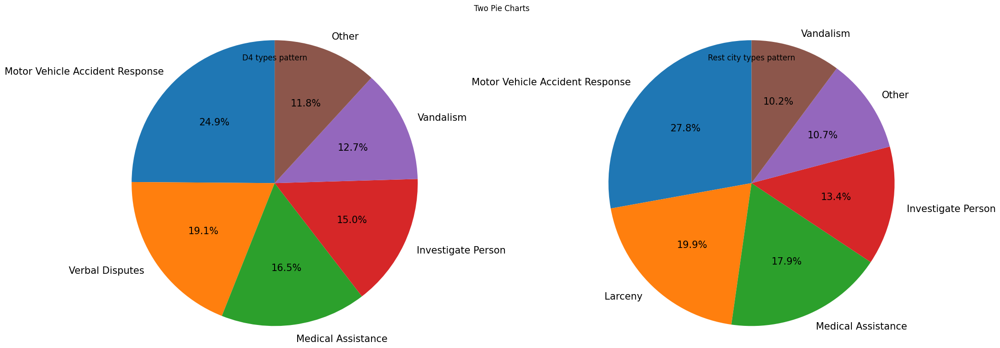

In [6]:
# print(crime_incident.OFFENSE_CODE_GROUP.value_counts())
import geopandas as gpd

distrcit_shape = gpd.read_file("../../data/City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson")

g_crime_incident = gpd.GeoDataFrame(crime_incident,geometry='geometry')
g_crime_incident = g_crime_incident.reset_index(drop=True)

d4area = distrcit_shape[distrcit_shape['DISTRICT']==4]

#d4 data stored inside filtered_gdf
d4_gdf = g_crime_incident[g_crime_incident.geometry.within(d4area.geometry.values[0])]
rest_gdf = g_crime_incident[~g_crime_incident.geometry.within(d4area.geometry.values[0])]
d4_type=d4_gdf.OFFENSE_CODE_GROUP.value_counts().head(6)
rest_type=rest_gdf.OFFENSE_CODE_GROUP.value_counts().head(6)


fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,8))
fig.subplots_adjust(wspace=1,hspace=2)
wedget, texts, autotexts=ax1.pie(d4_type,labels=d4_type.index,autopct='%1.1f%%', startangle=90,radius=1.5)
ax1.set_title('D4 types pattern')

wedget, texts1, autotexts1=ax2.pie(rest_type,labels=rest_type.index,autopct='%1.1f%%', startangle=90,radius=1.5)
ax2.set_title('Rest city types pattern')

fig.suptitle('Two Pie Charts')
plt.setp(texts, size=15)
plt.setp(texts1, size=15)
plt.setp(autotexts, size=15)
plt.setp(autotexts1, size=15)

plt.show()

From the above graph, the D4 has the following violence type pattern:

1.Motor vehicle accident
2.Verbal Disputes
3.Medical Assistance
4.Investigate Person
5.Vandalism
6.Other

The rest city has the following violence type pattern:

1.Motor vehicle accident
2.Larceny
3.Medical Assistance
4.Investigate Person
5.Other
6.Vandalism

Aggravated Assault    116
Homicide               31
Warrant Arrests        10
Robbery                 6
Ballistics              5
Firearm Violations      5
Name: OFFENSE_CODE_GROUP, dtype: int64
Aggravated Assault    310
Homicide               59
Warrant Arrests        29
Ballistics             20
Firearm Violations     20
Search Warrants        13
Name: OFFENSE_CODE_GROUP, dtype: int64


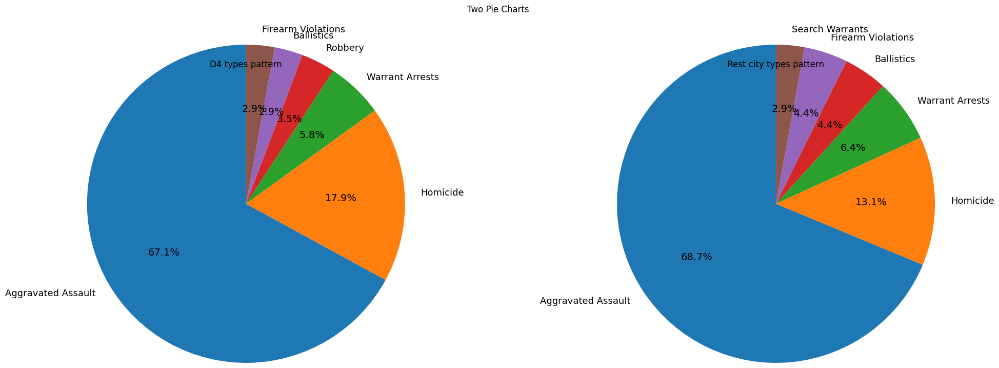

In [7]:
shooting_g_crime_incident=g_crime_incident.loc[g_crime_incident['SHOOTING']==1,:]

d4_gdf_shooting = shooting_g_crime_incident[shooting_g_crime_incident.geometry.within(d4area.geometry.values[0])]
rest_gdf_shooting = shooting_g_crime_incident[~shooting_g_crime_incident.geometry.within(d4area.geometry.values[0])]
d4_type_shooting=d4_gdf_shooting.OFFENSE_CODE_GROUP.value_counts().head(6)
rest_type_shooting=rest_gdf_shooting.OFFENSE_CODE_GROUP.value_counts().head(6)


print(d4_type_shooting.head(6))
print(rest_type_shooting.head(6))

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,8))
fig.subplots_adjust(wspace=1,hspace=2)
wedget, texts, autotexts=ax1.pie(d4_type_shooting,labels=d4_type_shooting.index, autopct='%1.1f%%', startangle=90,radius=1.5)
ax1.set_title('D4 types pattern')

wedget1, texts1, autotexts1=ax2.pie(rest_type_shooting,labels=rest_type_shooting.index, autopct='%1.1f%%', startangle=90,radius=1.5)
ax2.set_title('Rest city types pattern')

fig.suptitle('Two Pie Charts')
plt.setp(autotexts, size=14)
plt.setp(autotexts1, size=14)
plt.setp(texts, size=13)
plt.setp(texts1, size=13)
plt.show()

The above pie chart is showing the type of crime involving the shooting. We can see that the type are much different from the general crime.
For both D4 and rest cities in Boston, the aggravated assault has the highest rate of crime with shooting.
And the patterns are as following:
1. Aggravated Assault
2. Homicide
3. Warrant Arrest
4. Robbery(D4) / Ballistics(Rest cities)
5. Ballistics(D4) / Fire Violation(Rest cities)
6. Firearm Violation(D4) / Search Warrants(Rest cities)
As we can see, the Robbery and Firearm Violation have high percentage in the shooting crime.
It might be a clue that the income and firearm regulation is related to the shooting rate. We will figure this out in the future work.

Top 10 shooting street

WASHINGTON ST    80
BLUE HILL AVE    52
COLUMBIA RD      40
TALBOT AVE       28
HARVARD ST       25
GENEVA AVE       25
NORFOLK ST       24
MORTON ST        23
BOWDOIN ST       22
WESTVIEW ST      19
Name: STREET, dtype: int64


ValueError: keyword grid_b is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

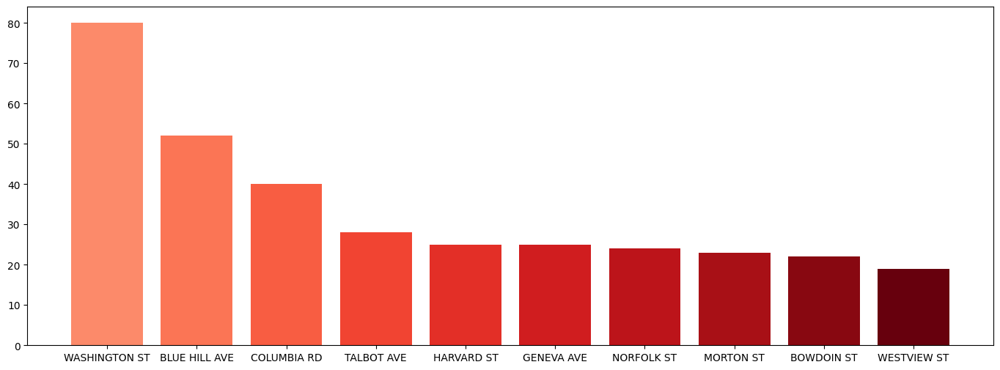

In [8]:
street_data=d4_gdf_shooting.STREET.value_counts()[:10]
print(street_data)
colors = np.linspace(0.4, 1, len(street_data))
colors = plt.cm.Reds(colors)
plt.figure(figsize=(17,6))
plt.bar(street_data.index,street_data,color=colors)
plt.grid(b=False)
plt.show()

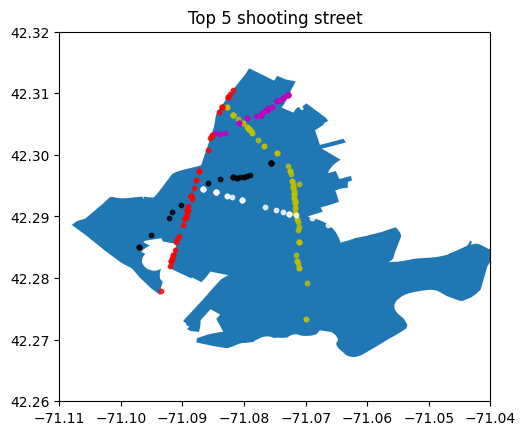

In [9]:
ax = d4area.plot()
ax.set_xlim(-71.11, -71.04)
ax.set_ylim(42.26, 42.32)
ax.set_title('Top 5 shooting street')
d4_gdf_shooting.loc[d4_gdf_shooting['STREET']=='WASHINGTON ST'].plot(ax=ax, marker='o', color='y', markersize=10, alpha = .8)
d4_gdf_shooting.loc[d4_gdf_shooting['STREET']=='BLUE HILL AVE'].plot(ax=ax, marker='o', color='r', markersize=10, alpha = .8)
d4_gdf_shooting.loc[d4_gdf_shooting['STREET']=='COLUMBIA RD'].plot(ax=ax, marker='o', color='m', markersize=10, alpha = .8)
d4_gdf_shooting.loc[d4_gdf_shooting['STREET']=='TALBOT AVE'].plot(ax=ax, marker='o', color='w', markersize=10, alpha = .8)
d4_gdf_shooting.loc[d4_gdf_shooting['STREET']=='HARVARD ST'].plot(ax=ax, marker='o', color='k', markersize=10, alpha = .8)
plt.show()

/var/folders/ct/ytm4tvld3jjc50738s4mm_6w0000gn/T/ipykernel_72014/2670023279.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_shape.loc[:,col] = shape[col]/shape[col].sum()


Text(0.5, 0, 'District')

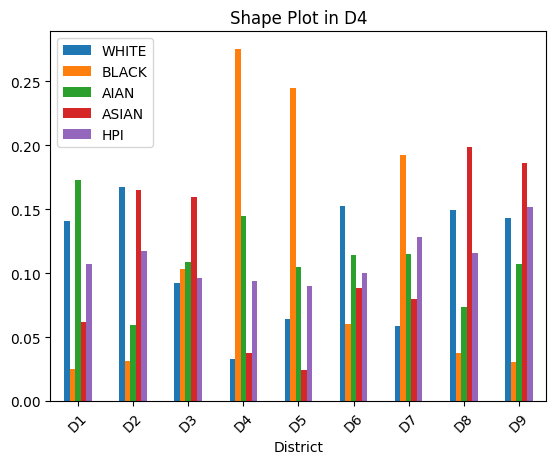

In [10]:
df_shape = shape[['SHORTNAME','TOTAL','TOTAL18','TOTALNH','WHITE', 'BLACK',
       'AIAN', 'ASIAN', 'HPI']]
for col in df_shape.columns[1:]:
    df_shape.loc[:,col] = shape[col]/shape[col].sum()
#temp.plot.bar(x = 'SHORTNAME', y = [lambda x: x/x.sum()])
df_shape.plot.bar(x='SHORTNAME',y = df_shape.columns[4:], rot = 45, title='Shape Plot in D4')

#TODO: solve warning
plt.xlabel('District')

We can see that the proportion of BLACK and MLTMN is relatively high, while the proportion of WHITE and ASIAN is relatively low in D4.

    Shootings Part
Based on the police map and district map in the "reference" folder, District 4 includes the B3, half of B2 and half of C11 in police district.

In [11]:
shootings.head()

,incident_num,shooting_date,district,shooting_type_v2,victim_gender,victim_race,victim_ethnicity_NIBRS,multi_victim
0,I152000196-00,2015-01-01 13:30:00+00,C11,Non-Fatal,Male,Black or African American,Not Hispanic or Latinx,f
1,I152000879-00,2015-01-04 01:58:00+00,E18,Non-Fatal,Male,Black or African American,Not Hispanic or Latinx,f
2,I152001014-00,2015-01-04 18:52:00+00,E5,Non-Fatal,Male,Black or African American,Not Hispanic or Latinx,f
3,I152002232-00,2015-01-08 22:45:00+00,B2,Non-Fatal,Male,Black or African American,Not Hispanic or Latinx,t
4,I152002233-00,2015-01-08 22:45:00+00,B2,Non-Fatal,Female,Black or African American,Not Hispanic or Latinx,t


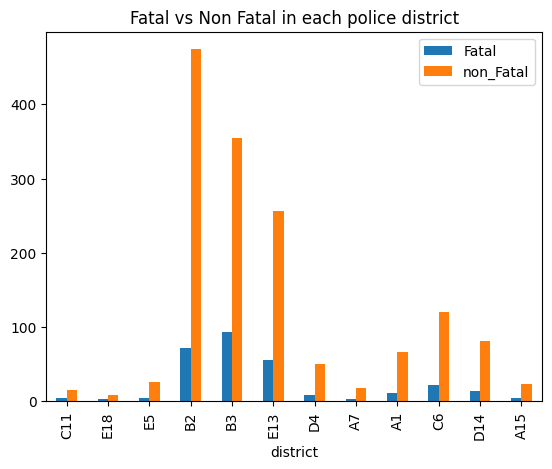

In [12]:
df_fnf = pd.DataFrame()
df_fnf['district'] = shootings['district'].unique()
df_fnf['Fatal']= shootings[shootings['shooting_type_v2'] == 'Fatal'].groupby(['district']).agg({'district': 'count'}).rename(columns={'district': 'x'}).reset_index()['x']
df_fnf['non_Fatal']= shootings[shootings['shooting_type_v2'] == 'Non-Fatal'].groupby(['district']).agg({'district': 'count'}).rename(columns={'district': 'x'}).reset_index()['x']
df_fnf.plot.bar(x='district')
plt.title('Fatal vs Non Fatal in each police district')
plt.show()

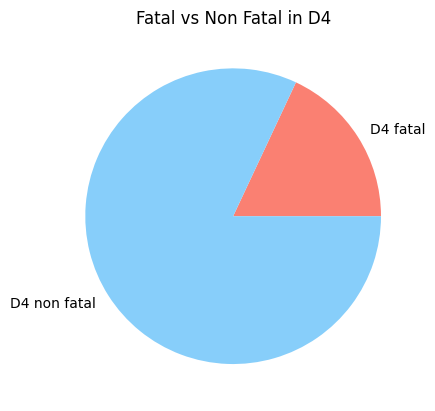

In [13]:
D4_fatal = 94 + 0.5*72 + 0.5*56
D4_nonFatal = 354 + 0.5*474 + 0.5*256
plt.pie([D4_fatal,D4_nonFatal], labels=['D4 fatal', 'D4 non fatal'], colors=['salmon', 'lightskyblue'])
plt.title('Fatal vs Non Fatal in D4')
plt.show()

#TODO: The bar chart in each district instead of polices districts

D4 analysis
Since the main police district in D4 is B3, we choose it for the following part, we can possibly improve our estimation by considering the rest part of police district in D4.

In [14]:
gender=(d4shooting['victim_gender'].value_counts()/d4shooting.shape[0]).plot(kind='bar',rot=0, title='Male vs Female in D4')


NameError: name 'd4shooting' is not defined

Above two images indicate that around 88% of the shooting events are non-Fatal and the ratio of male victim is much higher than the ratio of female victim.

In [15]:
gender=(d4shooting['victim_race'].value_counts()/d4shooting.shape[0]).plot(kind='bar',rot=0, title='victim race in D4')


NameError: name 'd4shooting' is not defined

Based on the chart, the ratio of black or african american victim is much higher than the ratio of other victim.

    Violence/Crime Part
Similarly to the previous part, we use the police distrcit B3 so far, and we can possibly improve it by constructing a more close estimation.  

The observation shows that out of the total number of violence incidents, only 6 involved the use of guns, while 1339 incidents did not involve any gunshots.

In [16]:
shootings.head()

,incident_num,shooting_date,district,shooting_type_v2,victim_gender,victim_race,victim_ethnicity_NIBRS,multi_victim
0,I152000196-00,2015-01-01 13:30:00+00,C11,Non-Fatal,Male,Black or African American,Not Hispanic or Latinx,f
1,I152000879-00,2015-01-04 01:58:00+00,E18,Non-Fatal,Male,Black or African American,Not Hispanic or Latinx,f
2,I152001014-00,2015-01-04 18:52:00+00,E5,Non-Fatal,Male,Black or African American,Not Hispanic or Latinx,f
3,I152002232-00,2015-01-08 22:45:00+00,B2,Non-Fatal,Male,Black or African American,Not Hispanic or Latinx,t
4,I152002233-00,2015-01-08 22:45:00+00,B2,Non-Fatal,Female,Black or African American,Not Hispanic or Latinx,t


In [17]:
len(crime_incident[crime_incident['SHOOTING']==1]['INCIDENT_NUMBER'].unique())

4377

In [18]:
shoots = crime_incident[crime_incident['SHOOTING']==1]['INCIDENT_NUMBER'].drop_duplicates()
shoots.count()

4377

In [19]:
import folium
import seaborn as sns
import geopandas as gpd
p_geo = gpd.read_file('../../data/Boston_Police_Stations.geojson')
distrcit_shape = gpd.read_file("../../data/City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson")

map_data=crime_incident.groupby('Location',as_index=False).size()
location=map_data.Location.str.replace("(","").str.replace(")","").str.split(",",expand=True)
map_data[['latitude','longitude']]=location
#print(map_data)
map_data.drop('Location',axis=1,inplace=True)
size = map_data.pop('size')
map_data.insert(2,'size',size)

#print(map_data)
base_map = Map(location=[42.33182960914501, -71.0734727352688], zoom_start=12)
HeatMap(map_data,cmap="crest").add_to(base_map)
temp = p_geo.to_crs(4326)

for i in range(len(temp)):
    folium.Circle(
        location=[temp.iloc[i]['CENTROIDY'],temp.iloc[i]['CENTROIDX']], 
        popup='Point 1A', radius=200, 
        weight=2, color='blue',
        fill=True,
        fill_color='blue'
        ).add_to(base_map)
style1 = {'fillColor': '#228B22', 'color': '#228B22'}
folium.GeoJson(distrcit_shape[distrcit_shape['DISTRICT']==4],style_function=lambda x:style1, name="geojson").add_to(base_map)
base_map.save('map.html')
base_map

/var/folders/ct/ytm4tvld3jjc50738s4mm_6w0000gn/T/ipykernel_72014/822236240.py:8: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  location=map_data.Location.str.replace("(","").str.replace(")","").str.split(",",expand=True)


From the heatmap, I observed that the east part of the district 4 has more violence.

ValueError: aspect must be finite and positive 

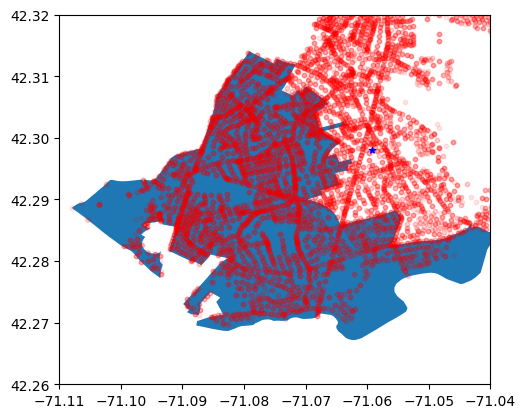

In [20]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
distrcit_shape = gpd.read_file("../../data/City_Council_Districts_-_Effective_for_the_2023_Municipal_Election.geojson")
# get the district 4 map
d4 = distrcit_shape[distrcit_shape['DISTRICT']==4]
# Convert the dataframe to a geopandas GeoDataFrame
geometry = gpd.points_from_xy(map_data.longitude, map_data.latitude)
locations_gdf = gpd.GeoDataFrame(map_data, geometry=geometry)
# print(locations_gdf)

# Plot the map with the locations
ax = d4.plot()
ax.set_xlim(-71.11, -71.04)
ax.set_ylim(42.26, 42.32)

# y = p_geo.loc[p_geo['geometry'].within(d4['geometry'].values[0])]
# y.plot(ax=ax, marker='o', color='b', markersize=5)
for i in range(9):
    x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    x.plot(ax=ax, marker='o', color='red', markersize=10, alpha = .1)
    y = p_geo.loc[p_geo['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    y.plot(ax=ax, marker='*', color='b', markersize=20)
    #TODO: Create circle
    # cir = plt.Circle(y['geometry'], radius=2, color='b', fill=False) # create circle around the point assigned
    # ax.add_patch(cir)

    #BUG: check the error message
ax

ValueError: ignored

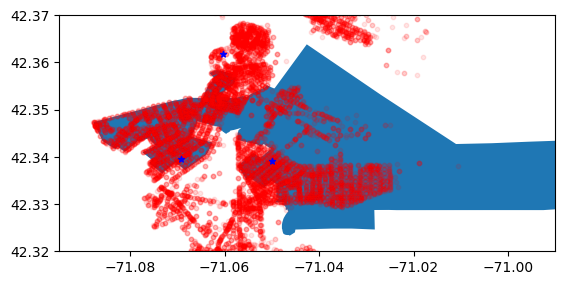

In [ ]:

# get the district 4 map
d2 = distrcit_shape[distrcit_shape['DISTRICT']==2]

# Plot the map with the locations
ax = d2.plot()
ax.set_xlim(-71.095, -70.99)
ax.set_ylim(42.32,42.37)

# y = p_geo.loc[p_geo['geometry'].within(d4['geometry'].values[0])]
# y.plot(ax=ax, marker='o', color='b', markersize=5)
for i in range(9):
    x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    x.plot(ax=ax, marker='o', color='red', markersize=10, alpha = .1)
    y = p_geo.loc[p_geo['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    y.plot(ax=ax, marker='*', color='b', markersize=20)

ValueError: ignored

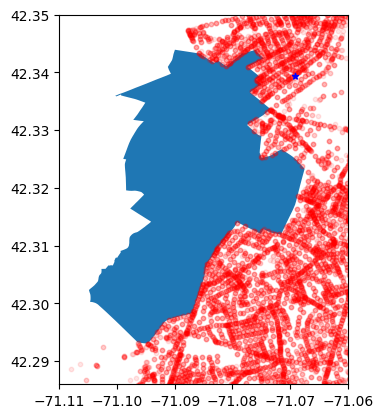

In [ ]:

# get the district 4 map
d7 = distrcit_shape[distrcit_shape['DISTRICT']==7]

# Plot the map with the locations
ax = d7.plot()
ax.set_xlim(-71.11, -71.06)
ax.set_ylim(42.286,42.35)

# y = p_geo.loc[p_geo['geometry'].within(d4['geometry'].values[0])]
# y.plot(ax=ax, marker='o', color='b', markersize=5)
for i in range(9):
    x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    x.plot(ax=ax, marker='o', color='red', markersize=10, alpha = .1)
    y = p_geo.loc[p_geo['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    y.plot(ax=ax, marker='*', color='b', markersize=20)
ax

ValueError: aspect must be finite and positive 

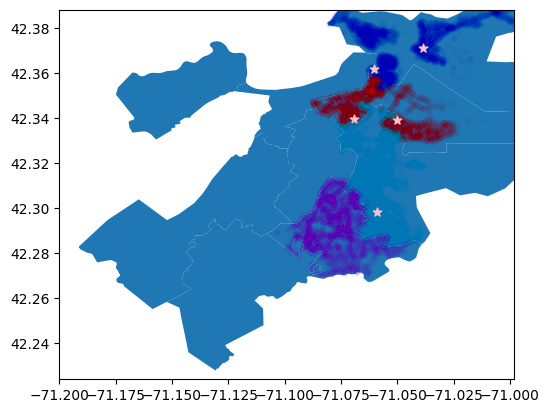

In [21]:
# Convert the dataframe to a geopandas GeoDataFrame
geometry = gpd.points_from_xy(map_data.longitude, map_data.latitude)
locations_gdf = gpd.GeoDataFrame(map_data, geometry=geometry)
# print(locations_gdf)

# Plot the map with the locations

ax = distrcit_shape.plot()
ax.set_xlim(-71.2,-70.998)
ax.set_ylim(42.224,42.388)
c = 'brcmykbbyb'
for i in range(9):
    x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    y = p_geo.loc[p_geo['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    
    x.plot(ax=ax, marker='o', color=c[i], markersize=10,alpha=0.01)
    y.plot(ax=ax, marker='*', color='pink', markersize=40)



In [22]:
#TODO: calculate the crime rate next to police station and those not
# radius can be 0.05
import math


r = 0.05

nearest_point_police_station = []
for i in range(len(p_geo)):
    p_lat = p_geo['CENTROIDY'][i]
    p_log = p_geo['CENTROIDX'][i]
    dist = np.transpose([map_data.latitude.astype('float'), map_data.longitude.astype('float')]) - [p_lat,p_log]
    dist = [np.linalg.norm(i) for i in dist]
    area_crime_num = [1 if (i<=r) else 0 for i in dist]
    nearest_point_police_station.append(sum(area_crime_num)/((r*r) * math.pi))
nearest_point_police_station.append(len(map_data)/sum(distrcit_shape.area))


/var/folders/ct/ytm4tvld3jjc50738s4mm_6w0000gn/T/ipykernel_72014/1947836085.py:16: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nearest_point_police_station.append(len(map_data)/sum(distrcit_shape.area))


<BarContainer object of 13 artists>

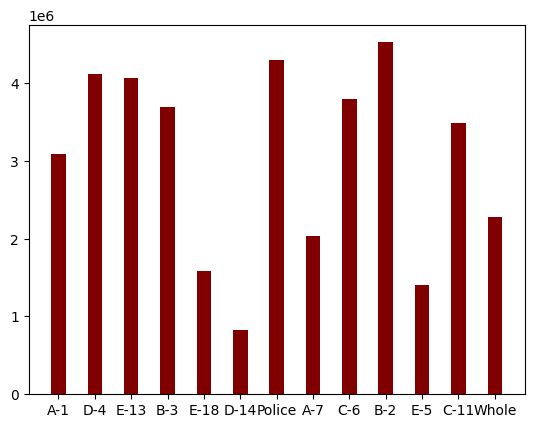

In [23]:
name = p_geo['NAME'].str.split(" ").str[1]
name = name.values

name = np.append(name,'Whole')
plt.bar(name, nearest_point_police_station, color ='maroon',
        width = 0.4)

The number of crime is not correlated with whether it is near a police station. And B-3 data do not show that most of the crime happen arround the police station

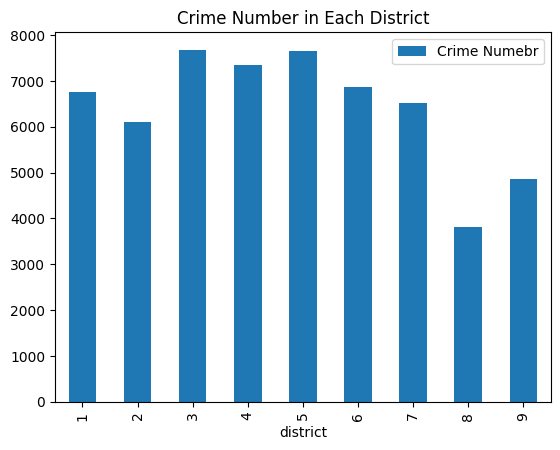

In [24]:
df_fnf = pd.DataFrame()
df_fnf['district'] = range(1,10)
temp = [len(locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i]['geometry'].values[0])]) for i in range(1,10)]
df_fnf['Crime Numebr']= temp
df_fnf.plot.bar(x='district')
plt.title('Crime Number in Each District')
plt.show()

We can tell that District 4 has relatively large proportion of shooting crimes compared to the whole city.

In [25]:
# heat map for thee whole city crime

map_data2=crime_incident.groupby(['Lat', 'Long'], as_index=False).size()

base_map_whole_city = Map(location=[42.33182960914501, -71.0734727352688], zoom_start=12)
HeatMap(map_data2).add_to(base_map_whole_city)

#set markers for shooting ones.
crime_incident_shooting = crime_incident[crime_incident["SHOOTING"]==1]

for index, row in crime_incident_shooting.iterrows():
    tooltip = f"{row['OFFENSE_CODE']} ({row['INCIDENT_NUMBER']} incident)"
    if not np.isnan(row['Lat']) and not np.isnan(row['Long']):
        Marker(location=[row['Lat'], row['Long']], tooltip=tooltip).add_to(base_map_whole_city)

base_map_whole_city.save('../../data/crime_map_whole_city.html')
base_map_whole_city

In [26]:
shooting_heatmap = Map(location=[42.33182960914501, -71.0734727352688], zoom_start=12)
HeatMap(crime_incident_shooting.groupby(['Lat', 'Long'], as_index=False).size()).add_to(shooting_heatmap)

temp = p_geo.to_crs(4326)

for i in range(len(temp)):
    folium.Circle(
        location=[temp.iloc[i]['CENTROIDY'],temp.iloc[i]['CENTROIDX']], 
        popup='Point 1A', radius=200, 
        weight=2, color='blue',
        fill=True,
        fill_color='blue'
        ).add_to(shooting_heatmap)
style1 = {'fillColor': '#228B22', 'color': '#228B22'}
folium.GeoJson(distrcit_shape[distrcit_shape['DISTRICT']==4],style_function=lambda x:style1, name="geojson").add_to(shooting_heatmap)


shooting_heatmap.save('../../data/shooting_heatmap.html')
shooting_heatmap

In [27]:
crime_incident_shooting_valied = crime_incident_shooting[crime_incident_shooting['Lat'].notna()]


ValueError: aspect must be finite and positive 

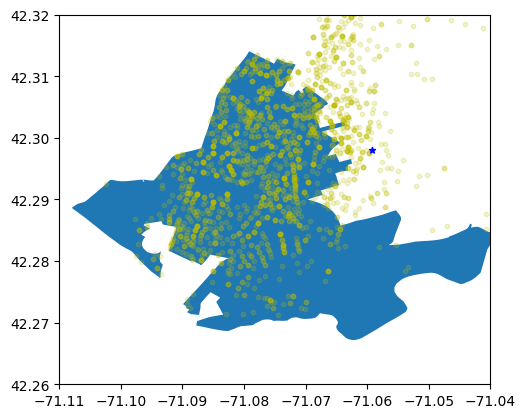

In [28]:
import geopandas as gpd
from shapely.geometry import Point, Polygon

size = map_data2.pop('size')
map_data2.insert(2,'size',size)

# get the district 4 map
d4 = distrcit_shape[distrcit_shape['DISTRICT']==4]
# Convert the dataframe to a geopandas GeoDataFrame
# geometry = gpd.points_from_xy(map_data.longitude, map_data.latitude)
# locations_gdf = gpd.GeoDataFrame(map_data, geometry=geometry)
shooting_geometry = gpd.points_from_xy(crime_incident_shooting_valied.Long, crime_incident_shooting_valied.Lat)
shooting_locations_gdf = gpd.GeoDataFrame(crime_incident_shooting_valied, geometry=shooting_geometry)

# Plot the map with the locations
ax = d4.plot()
ax.set_xlim(-71.11, -71.04)
ax.set_ylim(42.26, 42.32)

# y = p_geo.loc[p_geo['geometry'].within(d4['geometry'].values[0])]
# y.plot(ax=ax, marker='o', color='b', markersize=5)
for i in range(9):
    # x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    # x.plot(ax=ax, marker='o', color='red', markersize=10, alpha = .01)
    
    z = shooting_locations_gdf.loc[shooting_locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    z.plot(ax=ax, marker='o', color='y', markersize=10, alpha = .2)
    
    y = p_geo.loc[p_geo['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    y.plot(ax=ax, marker='*', color='b', markersize=20)
    
ax

ValueError: aspect must be finite and positive 

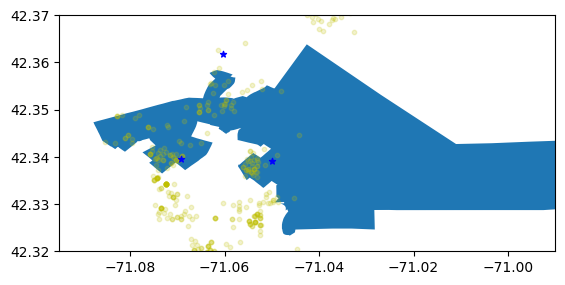

In [ ]:
d2 = distrcit_shape[distrcit_shape['DISTRICT']==2]

# Plot the map with the locations
ax = d2.plot()
ax.set_xlim(-71.095, -70.99)
ax.set_ylim(42.32,42.37)

# y = p_geo.loc[p_geo['geometry'].within(d4['geometry'].values[0])]
# y.plot(ax=ax, marker='o', color='b', markersize=5)
for i in range(9):
    # x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    # x.plot(ax=ax, marker='o', color='red', markersize=10, alpha = .01)
    
    z = shooting_locations_gdf.loc[shooting_locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    z.plot(ax=ax, marker='o', color='y', markersize=10, alpha = .2)
    
    y = p_geo.loc[p_geo['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    y.plot(ax=ax, marker='*', color='b', markersize=20)
    
ax

<AxesSubplot: >

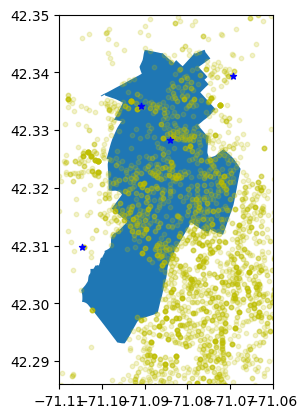

In [ ]:
d7 = distrcit_shape[distrcit_shape['DISTRICT']==7]

# Plot the map with the locations
ax = d7.plot()
ax.set_xlim(-71.11, -71.06)
ax.set_ylim(42.286,42.35)

# y = p_geo.loc[p_geo['geometry'].within(d4['geometry'].values[0])]
# y.plot(ax=ax, marker='o', color='b', markersize=5)
for i in range(9):
    # x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    # x.plot(ax=ax, marker='o', color='red', markersize=10, alpha = .01)
    
    z = shooting_locations_gdf.loc[shooting_locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    z.plot(ax=ax, marker='o', color='y', markersize=10, alpha = .2)
    
    y = p_geo.loc[p_geo['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    y.plot(ax=ax, marker='*', color='b', markersize=20)
    
ax

In [ ]:
import matplotlib.colors as mcolors
mcolors.CSS4_COLORS.keys()

dict_keys(['aliceblue', 'antiquewhite', 'aqua', 'aquamarine', 'azure', 'beige', 'bisque', 'black', 'blanchedalmond', 'blue', 'blueviolet', 'brown', 'burlywood', 'cadetblue', 'chartreuse', 'chocolate', 'coral', 'cornflowerblue', 'cornsilk', 'crimson', 'cyan', 'darkblue', 'darkcyan', 'darkgoldenrod', 'darkgray', 'darkgreen', 'darkgrey', 'darkkhaki', 'darkmagenta', 'darkolivegreen', 'darkorange', 'darkorchid', 'darkred', 'darksalmon', 'darkseagreen', 'darkslateblue', 'darkslategray', 'darkslategrey', 'darkturquoise', 'darkviolet', 'deeppink', 'deepskyblue', 'dimgray', 'dimgrey', 'dodgerblue', 'firebrick', 'floralwhite', 'forestgreen', 'fuchsia', 'gainsboro', 'ghostwhite', 'gold', 'goldenrod', 'gray', 'green', 'greenyellow', 'grey', 'honeydew', 'hotpink', 'indianred', 'indigo', 'ivory', 'khaki', 'lavender', 'lavenderblush', 'lawngreen', 'lemonchiffon', 'lightblue', 'lightcoral', 'lightcyan', 'lightgoldenrodyellow', 'lightgray', 'lightgreen', 'lightgrey', 'lightpink', 'lightsalmon', 'lights

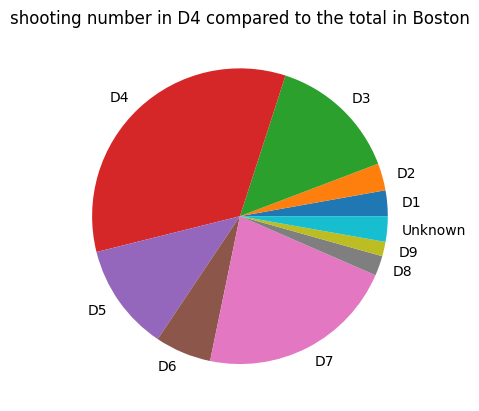

In [ ]:
#TODO: clean the duplicated data

res = []
name = []
#D4_shooting_count = 448 + 0.5 * 546 + 0.5 * 312
shooting_count = crime_incident_shooting.shape[0]
for i in range(9):
    # x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    # x.plot(ax=ax, marker='o', color='red', markersize=10, alpha = .01)
    z = shooting_locations_gdf.loc[shooting_locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    res.append(len(z))
    d = i+1
    name.append('D%d' % d)
name.append('Unknown')
res.append(shooting_count - sum(res))
plt.pie(res, labels=name, colors=mcolors.TABLEAU_COLORS.keys())
plt.title('shooting number in D4 compared to the total in Boston')
plt.show()

We can see the shooting violence focus mainly on D4.

In [ ]:
crime_d4 = crime_incident[crime_incident["DISTRICT"]=="B3"]

map_data_d4 = crime_d4.groupby(['Lat', 'Long'], as_index=False).size()

base_map_d4 = Map(location=[42.33182960914501, -71.0734727352688], zoom_start=12)
HeatMap(map_data_d4).add_to(base_map_d4)

#set markers for shooting ones.
crime_incident_shooting_d4 = crime_d4[crime_d4["SHOOTING"]==1]

for index, row in crime_incident_shooting_d4.iterrows():
    tooltip = f"{row['OFFENSE_CODE']} ({row['INCIDENT_NUMBER']} incident)"
    if not np.isnan(row['Lat']) and not np.isnan(row['Long']):
        Marker(location=[row['Lat'], row['Long']], tooltip=tooltip).add_to(base_map_d4)

base_map_d4.save('../../data/crime_map_d4.html')
base_map_d4

In terms of D4, shooting crime mainly happened in the northern part, which get closer to the city area

    School Discipline Part

In [29]:
D1_school = ['04100000', '024800002']
D2_school = ['04800000']
D3_school = ['04490000', '04390000', '04190000', '04440000']
D4_school = ['04380000', '35050000', '04630000', '04280000']
D5_school = ['04120000', '04160000', '04810000', '04630000', '04280000']
D6_school = []
D7_school = ['04240000', '04170000', '04370000', '04070000', '04840000']
D8_school = ['04690000']
D9_school = ['04110000']
Bos_city = ['00350000']
Bos_school = ['04100000', '024800002', '04800000', '04490000', '04390000', '04190000', '04440000', '04380000', '35050000', '04630000', '04280000', '04120000', '04160000', '04810000', '04630000', '04280000', '04240000', '04170000', '04370000', '04070000', '04840000', '04690000', '04110000']

# disc_dict: disciplines dictionary, 0: all schools in Boston, 1-9: 9 districts
disc_dict = {0 : disciplines[disciplines['District Code'].isin(Bos_school)]}
disc_dict[1] = disciplines[disciplines['District Code'].isin(D1_school)]
disc_dict[2] = disciplines[disciplines['District Code'].isin(D2_school)]
disc_dict[3] = disciplines[disciplines['District Code'].isin(D3_school)]
disc_dict[4] = disciplines[disciplines['District Code'].isin(D4_school)]
disc_dict[5] = disciplines[disciplines['District Code'].isin(D5_school)]
disc_dict[6] = disciplines[disciplines['District Code'].isin(D6_school)]
disc_dict[7] = disciplines[disciplines['District Code'].isin(D7_school)]
disc_dict[8] = disciplines[disciplines['District Code'].isin(D8_school)]
disc_dict[9] = disciplines[disciplines['District Code'].isin(D9_school)]

In [30]:
stuNum = [disc_dict[0]["Students"].astype(str).str.replace(',', '').astype(int).sum()]
stuDisc = [disc_dict[0]["Students Disciplined"].astype(str).str.replace(',', '').astype(int).sum()]
for i in range(1,10):
    stuNum.append(disc_dict[i]["Students"].astype(str).str.replace(',', '').astype(int).sum())
    stuDisc.append(disc_dict[i]["Students Disciplined"].astype(str).str.replace(',', '').astype(int).sum())
temp = disc_dict[4]['District Name'].str.split('(')
D4_schoolName = [x[0][:len(x[0])-1] for x in temp.tolist()]

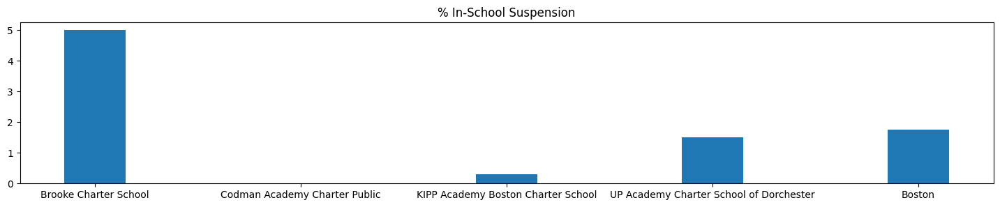

In [31]:
Bos_inSchool_suspension = disc_dict[0]['% In-School Suspension'].astype(float).mean()
D4_inSchool_suspension = disc_dict[4]['% In-School Suspension'].astype(float)
inSchool_suspension = D4_inSchool_suspension.tolist()
inSchool_suspension.append(Bos_inSchool_suspension)
name = [n for n in D4_schoolName]
name.append('Boston')

plt.figure(figsize=(18, 3))
plt.bar(name,inSchool_suspension, width=0.3)
plt.title('% In-School Suspension')
plt.ylim()
# plt.xticks(minor=True)
plt.show()


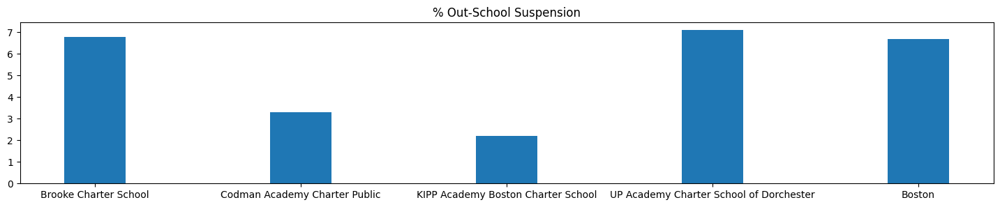

In [32]:
Bos_outSchool_suspension = disc_dict[0]['% Out-of-School Suspension'].astype(float).mean()
D4_outSchool_suspension = disc_dict[4]['% Out-of-School Suspension'].astype(float)
outSchool_suspension = D4_outSchool_suspension.tolist()
outSchool_suspension.append(Bos_outSchool_suspension)
name = [n for n in D4_schoolName]
name.append('Boston')

plt.figure(figsize=(18, 3))
plt.bar(name,outSchool_suspension, width=0.3)
plt.title('% Out-School Suspension')
plt.ylim()
plt.xticks(minor=True)
plt.show()

/var/folders/ct/ytm4tvld3jjc50738s4mm_6w0000gn/T/ipykernel_72014/807158759.py:1: RuntimeWarning: invalid value encountered in scalar divide
  disc_prop = [stuDisc[i] / stuNum[i] for i in range(10)]


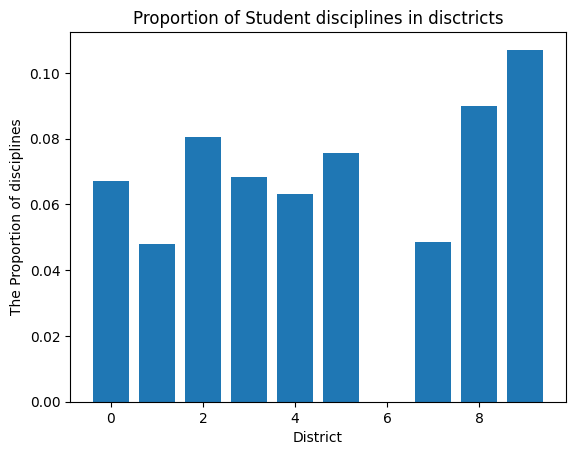

In [33]:
disc_prop = [stuDisc[i] / stuNum[i] for i in range(10)]
plt.bar(range(10), disc_prop)
plt.title("Proportion of Student disciplines in disctricts")
plt.xlabel('District')
plt.ylabel('The Proportion of disciplines')
plt.show()

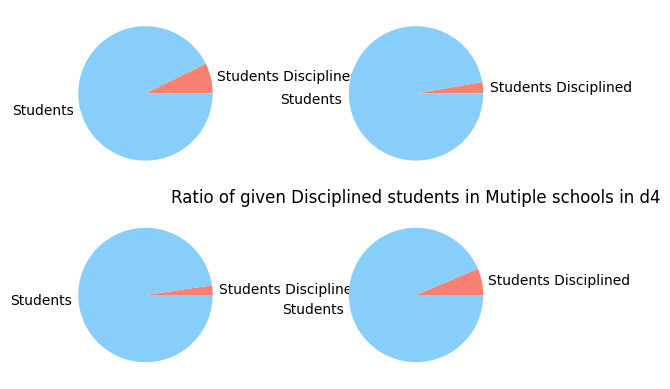

In [34]:
D4_stuNum = disc_dict[4]["Students"].tolist()
D4_stuDisc = disc_dict[4]["Students Disciplined"].tolist()

fig, ax = plt.subplots(2, 2)
for i in range(2):
    for j in range(2):
        ax[i, j].pie([process(D4_stuDisc[i*2+j]),process(D4_stuNum[i*2+j])], labels=['Students Disciplined', 'Students'], colors=['salmon', 'lightskyblue'])

plt.title('Ratio of given Disciplined students in Mutiple schools in d4')
plt.show()

    School Attendance Part

In [35]:
attendance.head()

,District Name,District Code,Attendance Rate,Average # of Absences,Absent 10 or more days,Chronically Absent (10% or more),Chronically Absent (20% or more),Unexcused > 9 days
1,Abby Kelley Foster Charter Public (District),04450000,94.5,9.8,41.3,15.3,2.4,40.5
2,Abington,00010000,91.1,15.3,61.6,29.7,8.0,28.6
3,Academy Of the Pacific Rim Charter Public (Dis...,04120000,88.1,20.6,73.5,46.0,14.5,0.2
4,Acton-Boxborough,06000000,95.0,8.8,34.2,10.9,2.0,0.7
5,Acushnet,00030000,93.8,11.0,51.1,15.9,1.5,24.8


In [36]:
# atd_dict: school attendace, 0: all schools in Boston, 1-9: 9 districts
atd_dict = {0 : attendance[attendance['District Code'].isin(Bos_school)]}
atd_dict[1] = attendance[attendance['District Code'].isin(D1_school)]
atd_dict[2] = attendance[attendance['District Code'].isin(D2_school)]
atd_dict[3] = attendance[attendance['District Code'].isin(D3_school)]
atd_dict[4] = attendance[attendance['District Code'].isin(D4_school)]
atd_dict[5] = attendance[attendance['District Code'].isin(D5_school)]
atd_dict[6] = attendance[attendance['District Code'].isin(D6_school)]
atd_dict[7] = attendance[attendance['District Code'].isin(D7_school)]
atd_dict[8] = attendance[attendance['District Code'].isin(D8_school)]
atd_dict[9] = attendance[attendance['District Code'].isin(D9_school)]

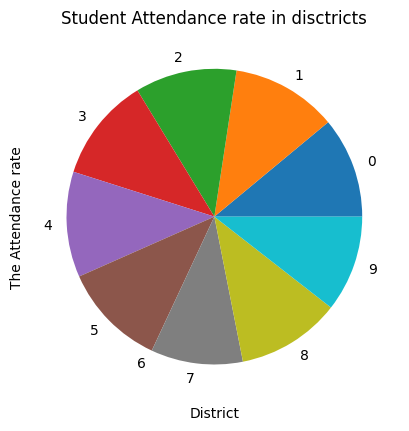

In [37]:
import math

atdRate = [atd_dict[0]["Attendance Rate"].astype(float).mean()]
for i in range(1,10):
    atdRate.append(atd_dict[i]["Attendance Rate"].astype(float).mean())
temp = atd_dict[4]['District Name'].str.split('(')
D4_schoolName = [x[0][:len(x[0])-1] for x in temp.tolist()]

atd_rate = [atdRate[i] for i in range(10)]
atd_rate = [0 if math.isnan(x) else x for x in atd_rate]
plt.pie(atd_rate, labels=range(10))
plt.title("Student Attendance rate in disctricts")
plt.xlabel('District')
plt.ylabel('The Attendance rate')
plt.show()

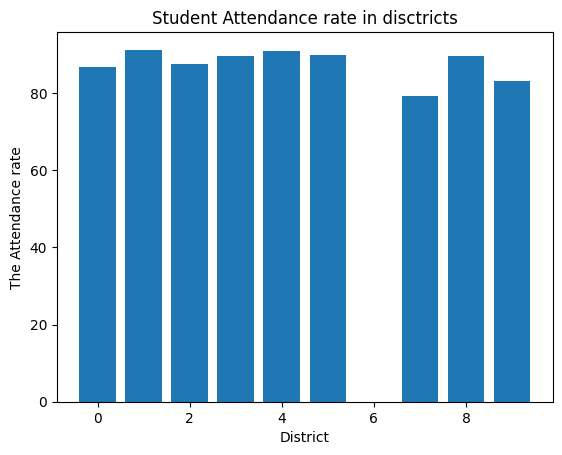

In [38]:
plt.bar(range(10), atd_rate)
plt.title("Student Attendance rate in disctricts")
plt.xlabel('District')
plt.ylabel('The Attendance rate')
plt.show()

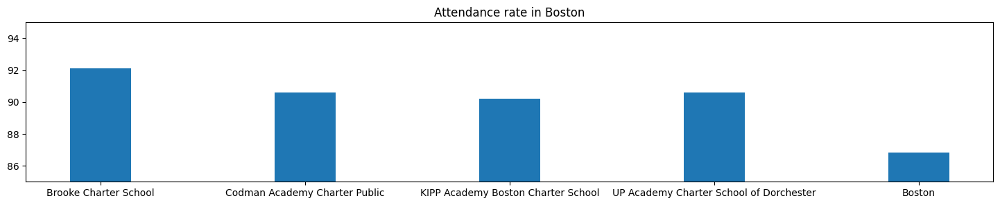

In [39]:
Bos_atd_rate = atd_dict[0]['Attendance Rate'].astype(float).mean()
D4_atd_rate = atd_dict[4]['Attendance Rate'].astype(float)
atd_rate = D4_atd_rate.tolist()
atd_rate.append(Bos_atd_rate)

plt.figure(figsize=(18, 3))
plt.bar(name,atd_rate, width=0.3)
plt.title('Attendance rate in Boston')
plt.ylim(85, 95)
plt.xticks(minor=True)
plt.show()

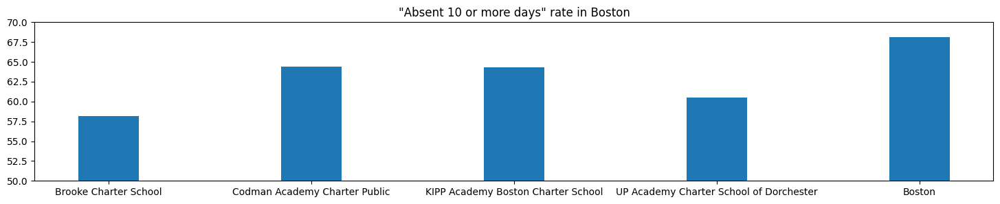

In [40]:
Bos_atd_rate = atd_dict[0]['Absent 10 or more days'].astype(float).mean()
D4_atd_rate = atd_dict[4]['Absent 10 or more days'].astype(float)
atd_rate = D4_atd_rate.tolist()
atd_rate.append(Bos_atd_rate)

plt.figure(figsize=(18, 3))
plt.bar(name,atd_rate, width=0.3)
plt.title('"Absent 10 or more days" rate in Boston')
plt.ylim(50, 70)
plt.xticks(minor=True)
plt.show()

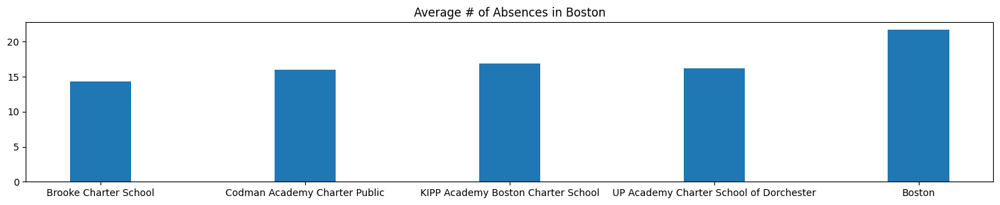

In [41]:
Bos_atd_rate = atd_dict[0]['Average # of Absences'].astype(float).mean()
D4_atd_rate = atd_dict[4]['Average # of Absences'].astype(float)
atd_rate = D4_atd_rate.tolist()
atd_rate.append(Bos_atd_rate)

plt.figure(figsize=(18, 3))
plt.bar(name,atd_rate, width=0.3)
plt.title('Average # of Absences in Boston')
plt.ylim()
plt.xticks(minor=True)
plt.show()

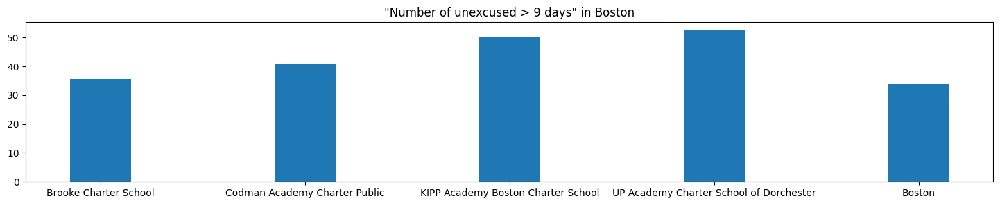

In [42]:
Bos_atd_rate = atd_dict[0]['Unexcused > 9 days'].astype(float).mean()
D4_atd_rate = atd_dict[4]['Unexcused > 9 days'].astype(float)
atd_rate = D4_atd_rate.tolist()
atd_rate.append(Bos_atd_rate)

plt.figure(figsize=(18, 3))
plt.bar(name,atd_rate, width=0.3)
plt.title('"Number of unexcused > 9 days" in Boston')
plt.ylim()
plt.xticks(minor=True)
plt.show()

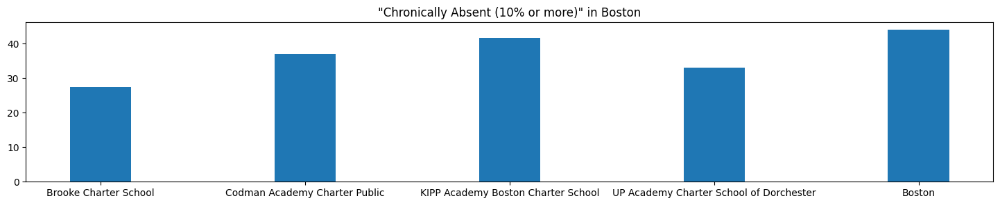

In [43]:
Bos_atd_rate = atd_dict[0]['Chronically Absent (10% or more)'].astype(float).mean()
D4_atd_rate = atd_dict[4]['Chronically Absent (10% or more)'].astype(float)
atd_rate = D4_atd_rate.tolist()
atd_rate.append(Bos_atd_rate)

plt.figure(figsize=(18, 3))
plt.bar(name,atd_rate, width=0.3)
plt.title('"Chronically Absent (10% or more)" in Boston')
plt.ylim()
plt.xticks(minor=True)
plt.show()

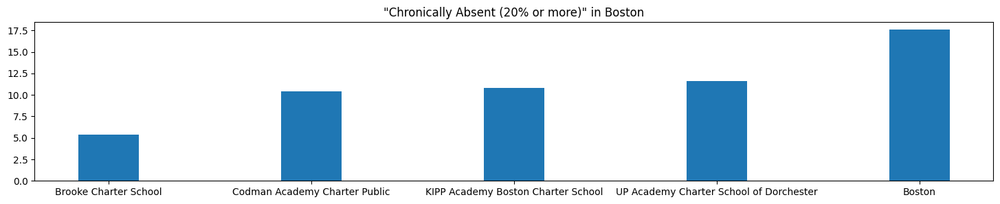

In [44]:
Bos_atd_rate = atd_dict[0]['Chronically Absent (20% or more)'].astype(float).mean()
D4_atd_rate = atd_dict[4]['Chronically Absent (20% or more)'].astype(float)
atd_rate = D4_atd_rate.tolist()
atd_rate.append(Bos_atd_rate)

plt.figure(figsize=(18, 3))
plt.bar(name,atd_rate, width=0.3)
plt.title('"Chronically Absent (20% or more)" in Boston')
plt.ylim()
plt.xticks(minor=True)
plt.show()

In [45]:
stuNum = [disc_dict[0]["Students"].astype(str).str.replace(',', '').astype(int).sum()]
stuDisc = [disc_dict[0]["Students Disciplined"].astype(str).str.replace(',', '').astype(int).sum()]
for i in range(1,10):
    stuNum.append(disc_dict[i]["Students"].astype(str).str.replace(',', '').astype(int).sum())
    stuDisc.append(disc_dict[i]["Students Disciplined"].astype(str).str.replace(',', '').astype(int).sum())

We noticed than 3 of 4 schools in d4 has a lower attendance than the median and average school attendance in this area, which may lead to a higher crime rate.

    School enrollment part

In [47]:
# enroll_dict: school enrollment, 0: all schools in Boston, 1-9: 9 districts
enroll_dict = {0 : enrollment[enrollment['District Code'].isin(Bos_school)]}
enroll_dict[1] = enrollment[enrollment['District Code'].isin(D1_school)]
enroll_dict[2] = enrollment[enrollment['District Code'].isin(D2_school)]
enroll_dict[3] = enrollment[enrollment['District Code'].isin(D3_school)]
enroll_dict[4] = enrollment[enrollment['District Code'].isin(D4_school)]
enroll_dict[5] = enrollment[enrollment['District Code'].isin(D5_school)]
enroll_dict[6] = enrollment[enrollment['District Code'].isin(D6_school)]
enroll_dict[7] = enrollment[enrollment['District Code'].isin(D7_school)]
enroll_dict[8] = enrollment[enrollment['District Code'].isin(D8_school)]
enroll_dict[9] = enrollment[enrollment['District Code'].isin(D9_school)]


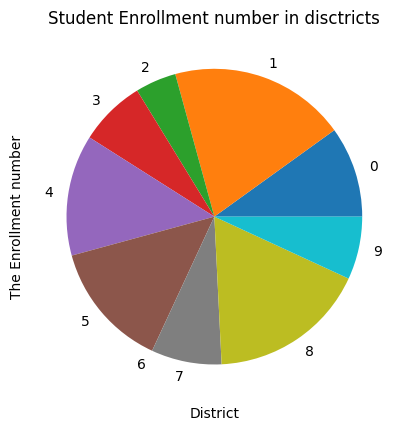

In [49]:
enrollRate = [enroll_dict[0]["Total"].astype(str).str.replace(',', '').astype(int).mean()]
for i in range(1,10):
    enrollRate.append(enroll_dict[i]["Total"].astype(str).str.replace(',', '').astype(int).mean())
temp = enroll_dict[4]['District Name'].str.split('(')
D4_schoolName = [x[0][:len(x[0])-1] for x in temp.tolist()]

enroll_rate = [enrollRate[i] for i in range(10)]
enroll_rate = [0 if math.isnan(x) else x for x in enroll_rate]
plt.pie(enroll_rate, labels=range(10))
plt.title("Student Enrollment number in disctricts")
plt.xlabel('District')
plt.ylabel('The Enrollment number')
plt.show()

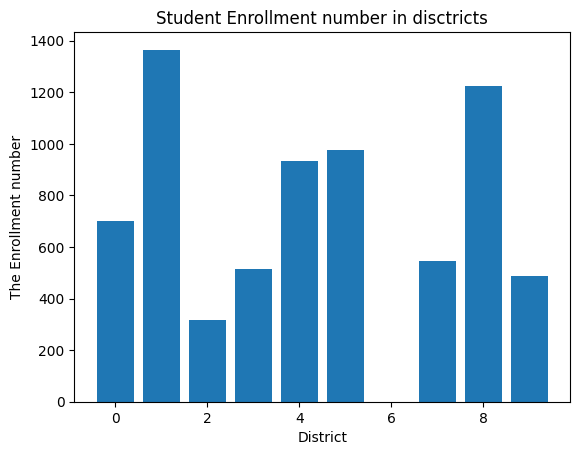

In [50]:
plt.bar(range(10), enroll_rate)
plt.title("Student Enrollment number in disctricts")
plt.xlabel('District')
plt.ylabel('The Enrollment number')
plt.show()

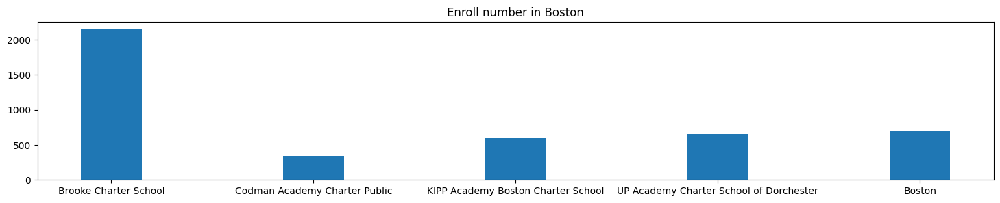

In [53]:
Bos_atd_enroll = enroll_dict[0]['Total'].astype(str).str.replace(',', '').astype(int).mean()
D4_atd_enroll = enroll_dict[4]['Total'].astype(str).str.replace(',', '').astype(int)
atd_enroll = D4_atd_enroll.tolist()
atd_enroll.append(Bos_atd_enroll)

plt.figure(figsize=(18, 3))
plt.bar(name,atd_enroll, width=0.3)
plt.title('Enroll number in Boston')
plt.show()

Similarly, we noticed than 3 of 4 schools in d4 has a lower enrollment than the average school enrollment in this area, which may lead to higher crime rate.


Traffic Part

<Axes: >

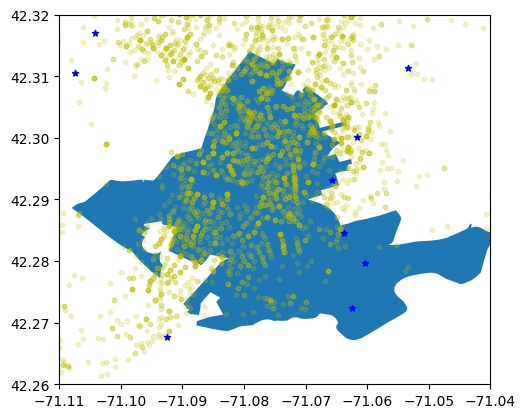

In [54]:
traffic_location = traffic.groupby(['stop_lat', 'stop_lon'],as_index=False).size()
# get the district 4 map
d4 = distrcit_shape[distrcit_shape['DISTRICT']==4]
# Convert the dataframe to a geopandas GeoDataFrame
# geometry = gpd.points_from_xy(map_data.longitude, map_data.latitude)
# locations_gdf = gpd.GeoDataFrame(map_data, geometry=geometry)
shooting_geometry = gpd.points_from_xy(crime_incident_shooting_valied.Long, crime_incident_shooting_valied.Lat)
shooting_locations_gdf = gpd.GeoDataFrame(crime_incident_shooting_valied, geometry=shooting_geometry)

traffic_geometry = gpd.points_from_xy(traffic_location.stop_lon, traffic_location.stop_lat)
traffic_locations_gdf = gpd.GeoDataFrame(traffic_location, geometry=traffic_geometry)
# Plot the map with the locations
ax = d4.plot()
ax.set_xlim(-71.11, -71.04)
ax.set_ylim(42.26, 42.32)

# y = p_geo.loc[p_geo['geometry'].within(d4['geometry'].values[0])]
# y.plot(ax=ax, marker='o', color='b', markersize=5)
for i in range(9):
    # x = locations_gdf.loc[locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    # x.plot(ax=ax, marker='o', color='red', markersize=10, alpha = .01)
    
    z = shooting_locations_gdf.loc[shooting_locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    z.plot(ax=ax, marker='o', color='y', markersize=10, alpha = .2)
    
    y = traffic_locations_gdf.loc[traffic_locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i+1]['geometry'].values[0])]
    y.plot(ax=ax, marker='*', color='b', markersize=20)
    
ax

In [55]:
name = ['D1','D2','D3','D4','D5','D6','D7','D8','D9']
stop_num = []
gunviolence_num = []
for i in range(1,10):
    n = len(traffic_locations_gdf.loc[traffic_locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i]['geometry'].values[0])])
    gunviolence_num.append(len(shooting_locations_gdf.loc[shooting_locations_gdf['geometry'].within(distrcit_shape[distrcit_shape['DISTRICT']==i]['geometry'].values[0])]))
    stop_num.append(n)

def normalize(lst):
    s = sum(lst)
    return map(lambda x: float(x)/s, lst)
gunviolence_num_norm = [i for i in normalize(gunviolence_num)]
stop_num_norm = [i for i in normalize(stop_num)]

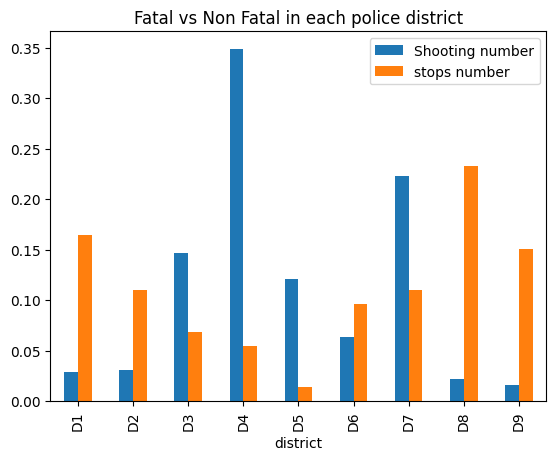

In [56]:
traffic_hist_df = pd.DataFrame()
traffic_hist_df['district'] = name
traffic_hist_df['Shooting number']= gunviolence_num_norm
traffic_hist_df['stops number']= stop_num_norm
traffic_hist_df.plot.bar(x='district')
plt.title('Fatal vs Non Fatal in each police district')
plt.show()

    Firearms Transactions Part

In [57]:
licenses.head()
#TODO: same problems in discipline, trying to distinguish the district

,Licensing Authority,License Type,Count
0,ABINGTON PD,Firearms Identification Card,41
1,ABINGTON PD,Resident Class A Large Capacity License to Car...,1524
2,ABINGTON PD,Resident License to Possess a Machine Gun,4
3,ACTON PD,Firearms Identification Card,64
4,ACTON PD,Resident Class A Large Capacity License to Car...,1034


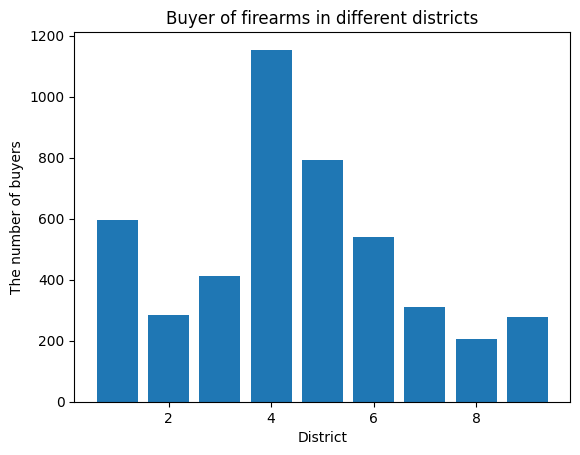

In [58]:
# Zipcode dictionary based on the district map and zipcode map in the "reference"
zipcode_dict = {}
zipcode_dict[1] = [2113.0, 2129.0, 2128.0, 2151.0]
zipcode_dict[2] = [2203.0, 2109.0, 2110.0, 2111.0, 2210.0, 2127.0]
zipcode_dict[3] = [2125.0, 2122.0]
zipcode_dict[4] = [2121.0, 2124.0, 2126.0, 2131.0, 2130.0]
zipcode_dict[5] = [2136.0, 2126.0, 2131.0]
zipcode_dict[6] = [2130.0, 2467.0, 2132.0]
zipcode_dict[7] = [2118.0, 2119.0, 2120.0]
zipcode_dict[8] = [2215.0, 2199.0, 2116.0, 2114.0, 2108.0]
zipcode_dict[9] = [2467.0, 2135.0, 2134.0, 2163.0]

buyer_count = [transactions['BUYER ZIP'].isin(zipcode_dict[x]).sum() for x in zipcode_dict]
plt.bar(range(1,10), buyer_count)
plt.title("Buyer of firearms in different districts")
plt.xlabel('District')
plt.ylabel('The number of buyers')
plt.show()


Based on the plot, we found the buyer of guns is highest in District 4 compared to other districts, which can be one of the drivers of violence in District 4.

In [59]:
dropout_2015 = pd.read_excel('../../data/dropout_2015.xlsx')
dropout_2016 = pd.read_excel('../../data/dropout_2016.xlsx')
dropout_2017 = pd.read_excel('../../data/dropout_2017.xlsx')
dropout_2018 = pd.read_excel('../../data/dropout_2018.xlsx')
dropout_2019 = pd.read_excel('../../data/dropout_2019.xlsx')
dropout_2020 = pd.read_excel('../../data/dropout_2020.xlsx')
dropout_2021 = pd.read_excel('../../data/dropout_2021.xlsx')

In [60]:
dropout_2015 = replace_header(dropout_2015)
dropout_2016 = replace_header(dropout_2016)
dropout_2017 = replace_header(dropout_2017)
dropout_2018 = replace_header(dropout_2018)
dropout_2019 = replace_header(dropout_2019)
dropout_2020 = replace_header(dropout_2020)
dropout_2021 = replace_header(dropout_2021)


In [61]:
gradrates_2022 = pd.read_excel('../../data/gradrates_2022.xlsx')
sat_performance_2021 = pd.read_excel('../../data/sat_performance_2021.xlsx')
NetSchoolSpending_2020 = pd.read_excel('../../data/NetSchoolSpending_2020.xlsx')


gradrates_2022 = replace_header(gradrates_2022)
sat_performance_2021 = replace_header(sat_performance_2021)
NetSchoolSpending_2020 = replace_header(NetSchoolSpending_2020)

In [62]:
# gradrates_2022_dict: the graduation rate in 2022, 0: all schools in Boston, 1-9: 9 districts
gradrates_2022_dict = {0 : gradrates_2022[gradrates_2022['District Code'].isin(Bos_school)]}
gradrates_2022_dict[1] = gradrates_2022[gradrates_2022['District Code'].isin(D1_school)]
gradrates_2022_dict[2] = gradrates_2022[gradrates_2022['District Code'].isin(D2_school)]
gradrates_2022_dict[3] = gradrates_2022[gradrates_2022['District Code'].isin(D3_school)]
gradrates_2022_dict[4] = gradrates_2022[gradrates_2022['District Code'].isin(D4_school)]
gradrates_2022_dict[5] = gradrates_2022[gradrates_2022['District Code'].isin(D5_school)]
gradrates_2022_dict[6] = gradrates_2022[gradrates_2022['District Code'].isin(D6_school)]
gradrates_2022_dict[7] = gradrates_2022[gradrates_2022['District Code'].isin(D7_school)]
gradrates_2022_dict[8] = gradrates_2022[gradrates_2022['District Code'].isin(D8_school)]
gradrates_2022_dict[9] = gradrates_2022[gradrates_2022['District Code'].isin(D9_school)]

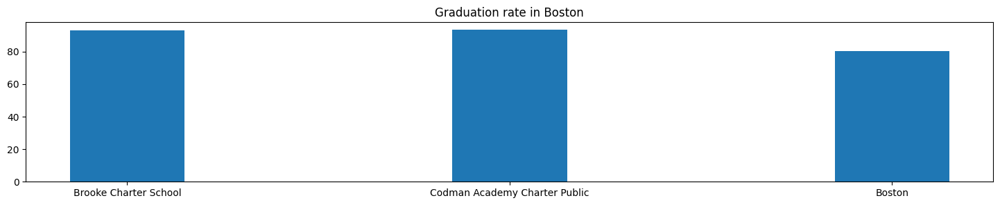

In [63]:
Bos_gradrates_2022 = gradrates_2022_dict[0]['% Graduated'].astype(float).mean()
D4_gradrates_2022 = gradrates_2022_dict[4]['% Graduated'].astype(float)
gradrates_2022_list = D4_gradrates_2022.tolist()
gradrates_2022_list.append(Bos_gradrates_2022)
temp = gradrates_2022_dict[4]['District Name'].str.split('(')
D4_schoolName = [x[0][:len(x[0])-1] for x in temp.tolist()]
name = [n for n in D4_schoolName]
name.append('Boston')

plt.figure(figsize=(18, 3))
plt.bar(name, gradrates_2022_list, width=0.3)
plt.title('Graduation rate in Boston')
plt.show()

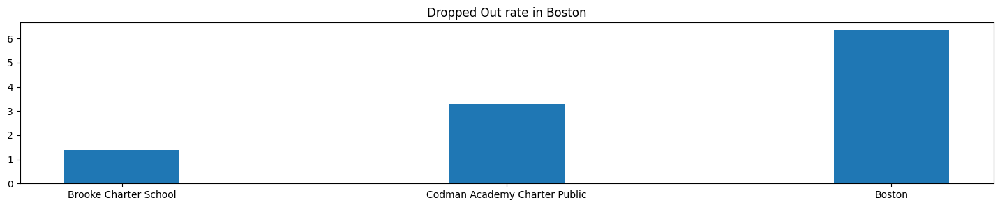

In [64]:
Bos_gradrates_2022 = gradrates_2022_dict[0]['% Dropped Out'].astype(float).mean()
D4_gradrates_2022 = gradrates_2022_dict[4]['% Dropped Out'].astype(float)
gradrates_2022_list = D4_gradrates_2022.tolist()
gradrates_2022_list.append(Bos_gradrates_2022)
temp = gradrates_2022_dict[4]['District Name'].str.split('(')
D4_schoolName = [x[0][:len(x[0])-1] for x in temp.tolist()]
name = [n for n in D4_schoolName]
name.append('Boston')

plt.figure(figsize=(18, 3))
plt.bar(name, gradrates_2022_list, width=0.3)
plt.title('Dropped Out rate in Boston')
plt.show()

In [67]:
# sat_performance_2021_dict: the graduation rate in 2022, 0: all schools in Boston, 1-9: 9 districts
sat_performance_2021_dict = {0 : sat_performance_2021[sat_performance_2021['District Code'].isin(Bos_school)]}
sat_performance_2021_dict[1] = sat_performance_2021[sat_performance_2021['District Code'].isin(D1_school)]
sat_performance_2021_dict[2] = sat_performance_2021[sat_performance_2021['District Code'].isin(D2_school)]
sat_performance_2021_dict[3] = sat_performance_2021[sat_performance_2021['District Code'].isin(D3_school)]
sat_performance_2021_dict[4] = sat_performance_2021[sat_performance_2021['District Code'].isin(D4_school)]
sat_performance_2021_dict[5] = sat_performance_2021[sat_performance_2021['District Code'].isin(D5_school)]
sat_performance_2021_dict[6] = sat_performance_2021[sat_performance_2021['District Code'].isin(D6_school)]
sat_performance_2021_dict[7] = sat_performance_2021[sat_performance_2021['District Code'].isin(D7_school)]
sat_performance_2021_dict[8] = sat_performance_2021[sat_performance_2021['District Code'].isin(D8_school)]
sat_performance_2021_dict[9] = sat_performance_2021[sat_performance_2021['District Code'].isin(D9_school)]

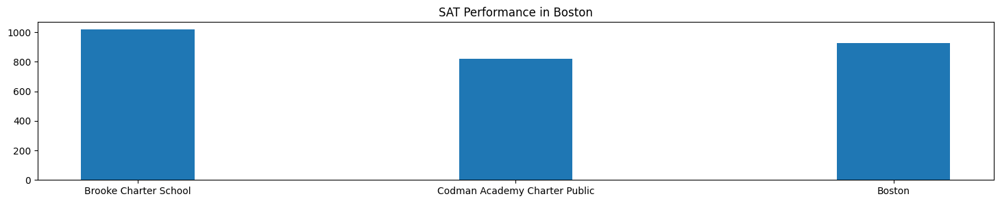

In [68]:
Bos_sat_performance_2021 = sat_performance_2021_dict[0]['Reading / Writing'].astype(float).mean() + sat_performance_2021_dict[4]['Math'].astype(float).mean()
D4_sat_performance_2021 = sat_performance_2021_dict[4]['Reading / Writing'].astype(float) + sat_performance_2021_dict[4]['Math'].astype(float)
sat_performance_2021_list = D4_sat_performance_2021.tolist()
sat_performance_2021_list.append(Bos_sat_performance_2021)
temp = sat_performance_2021_dict[4]['District Name'].str.split('(')
D4_schoolName = [x[0][:len(x[0])-1] for x in temp.tolist()]
name = [n for n in D4_schoolName]
name.append('Boston')

plt.figure(figsize=(18, 3))
plt.bar(name, sat_performance_2021_list, width=0.3)
plt.title('SAT Performance in Boston')
plt.show()

In [69]:
sat_performance_2021[sat_performance_2021['District Code'] == '00350000']

,District Name,District Code,Tests Taken,Reading / Writing,Writing,Math
35,Boston,00350000,"3,269",502,NaN,507
